In [1]:
!pip install -U -q kaggle
!mkdir -p ~/.kaggle
!echo '{"username":"jiahaowei","key":"ad338736d28106fb6e8d1663d5fd7548"}' > ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d grassknoted/asl-alphabet

 98% 1.01G/1.03G [00:09<00:00, 46.9MB/s]
100% 1.03G/1.03G [00:09<00:00, 117MB/s] 


In [2]:
!unzip  /content/asl-alphabet.zip

Streaming output truncated to the last 5000 lines.
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing190.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1900.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1901.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1902.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1903.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1904.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1905.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1906.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1907.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1908.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing1909.jpg  
  inflating: asl_alphabet_train/asl_alphabet_train/nothing/nothing191.jpg  
  inflating: asl_alphabet_t

In [3]:
import tensorflow as tf
tf.enable_eager_execution()

import matplotlib.pyplot as plt
import numpy as np
import os,cv2
import PIL
import time
from skimage.io import imshow
import keras
from sklearn.model_selection import train_test_split

from IPython.display import display

Using TensorFlow backend.


In [0]:
labels_dict = {'A':0 ,'B':1 ,'C':2 ,'D':3 ,'E':4 ,'F':5, 'G':6 ,'H':7, 'I':8 ,'J':9 ,'K':10, 'L':11, 'M':12, 'N':13, 'O':14, 'P':15, 'Q':16, 'R':17, 'S':18, 'T':19, 'U':20, 'V':21, 'W':22, 'X':23, 'Y':24, 'Z':25, 'space':26, 'del':27, 'nothing':28}


def load_data():
	images = []
	labels = []
	size = 64,64
	print("LOADING DATA FROM :　",end = "")
	for folder in os.listdir(train_dir):
		print(folder,end = ' | ')
		for image in os.listdir(train_dir + "/" + folder):
			temp_img = cv2.imread(train_dir + '/' + folder + '/'  + image)
			temp_img = cv2.resize(temp_img, size)
			images.append(img_to_float(temp_img))
			labels.append(labels_dict[folder])


	images = np.array(images)
	images = images.astype('float32')
	
	labels = keras.utils.to_categorical(labels)
	
	X_train, X_test, Y_train, Y_test = train_test_split(images, labels, test_size = 0.05)
	
	
	print()
	print('Loaded',len(X_train), 'images for training, ' , 'Train data shape = ', X_train.shape)
	print('Loaded',len(X_test), 'images for testing, ' , 'Test data shape = ', X_test.shape)
	
	return X_train, X_test, Y_train, Y_test

In [0]:
#os.chdir('/home/linsam/kaggle/cifar_10') 
train_dir = "/content/asl_alphabet_train"



In [0]:
def img_to_float(img):
  return (np.float32(img)-127.5)/127.5
def img_to_uint8(img):
  return np.uint8(img*127.5+128).clip(0, 255)

In [7]:
train_images, test_images, train_labels, test_labels = load_data()


LOADING DATA FROM :　Z | S | L | F | N | Q | R | A | O | J | M | del | U | G | nothing | X | Y | T | K | space | C | H | W | B | D | E | P | V | I | 
Loaded 82650 images for training,  Train data shape =  (82650, 64, 64, 3)
Loaded 4350 images for testing,  Test data shape =  (4350, 64, 64, 3)


In [8]:
train_images.dtype, train_images.shape

(dtype('float32'), (82650, 64, 64, 3))

In [9]:
train_labels[10]

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)

/usr/local/lib/python3.6/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


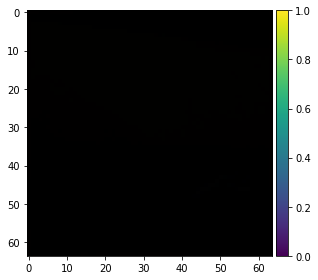

In [10]:
train_img_f32 = img_to_float(train_images)
imshow(img_to_uint8(train_img_f32[0]))

In [0]:
BUFFER_SIZE = train_img_f32.shape[0]
BATCH_SIZE = 25
train_dataset_y = tf.data.Dataset.from_tensor_slices(train_labels)
train_dataset_x = tf.data.Dataset.from_tensor_slices(train_images)
train_dataset = tf.data.Dataset.zip((train_dataset_x, train_dataset_y)).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [0]:
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Reshape
from tensorflow.keras.layers import  Conv2DTranspose, Input, concatenate, Conv2D
from tensorflow.keras import Model
latent_dim = 100

_0 = Input((latent_dim,))
_1 = Input((29,))
_ = concatenate([_0, _1])
_ = Dense(4*4*256, use_bias=False, input_shape=(latent_dim,))(_)
_ = BatchNormalization()(_)
_ = LeakyReLU()(_)
_ = Reshape((4, 4, 256))(_)
_ = Conv2DTranspose(128, (4, 4), strides=(4, 4), padding='same', use_bias=False)(_)
_ = BatchNormalization()(_)
_ = LeakyReLU()(_)
_ = Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False)(_)
_ = BatchNormalization()(_)
_ = LeakyReLU()(_)
_ = Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same', use_bias=False)(_)
_ = BatchNormalization()(_)
_ = LeakyReLU()(_)
_ = Conv2D(3, (3, 3), strides=(1, 1), padding='same', activation='tanh')(_)
generator = Model(inputs=[_0,_1], outputs=_)

In [13]:
generator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 29)]         0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 129)          0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 4096)         528384      concatenate[0][0]            

In [0]:
from tensorflow.keras.layers import Conv2D, Dropout, Flatten
_i = Input((64,64, 3))
_ = Conv2D(64, (3, 3), strides=(2, 2), padding='same')(_i)
_ = LeakyReLU()(_)
_ = Conv2D(128, (3, 3), strides=(2, 2), padding='same', use_bias=False)(_)
_ = BatchNormalization()(_)
_ = LeakyReLU()(_)
_ = Conv2D(128, (3, 3), strides=(2, 2), padding='same', use_bias=False)(_)
_ = BatchNormalization()(_)
_ = LeakyReLU()(_)
_ = Conv2D(128, (3, 3), strides=(2, 2), padding='same', use_bias=False)(_)
_ = BatchNormalization()(_)
_ = LeakyReLU()(_)
_ = Flatten()(_)
_0 = Dense(1)(_)
_1 = Dense(29)(_)

discriminator = Model(inputs=_i, outputs=[_0, _1])

In [0]:
def generator_loss(generated_output, labels):
  out_d, out_c = generated_output
  loss_d = tf.losses.sigmoid_cross_entropy(tf.ones_like(out_d), out_d)
  loss_c = tf.losses.softmax_cross_entropy(labels, out_c)
  return loss_d+loss_c

In [0]:
def discriminator_loss(real_output, generated_output, labels):
    # [1,1,...,1] with real output since it is true and we want our generated examples to look like it
    real_out_d, real_out_c = real_output
    real_loss_d = tf.losses.sigmoid_cross_entropy(multi_class_labels=tf.ones_like(real_out_d), logits=real_out_d)
    real_loss_c = tf.losses.softmax_cross_entropy(labels, real_out_c)
    real_loss = real_loss_d + real_loss_c

    # [0,0,...,0] with generated images since they are fake
    generated_out_d, generated_out_c = generated_output
    generated_loss = tf.losses.sigmoid_cross_entropy(multi_class_labels=tf.zeros_like(generated_out_d), logits=generated_out_d)
    total_loss = real_loss + generated_loss

    return total_loss

In [0]:
generator_optimizer = tf.train.AdamOptimizer(1e-4)
discriminator_optimizer = tf.train.AdamOptimizer(1e-4)

In [0]:
EPOCHS = 50
num_examples_to_generate = 20

# We'll re-use this random vector used to seed the generator so
# it will be easier to see the improvement over time.
random_vector_for_generation = tf.random_normal([num_examples_to_generate,
                                                 latent_dim])
condition_vector_generation = tf.one_hot(list(range(10))+list(range(10)), 29)

In [0]:
def train_step(images, labels):
   # generating noise from a normal distribution
      noise = tf.random_normal([BATCH_SIZE, latent_dim])
      
      with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images= generator([noise, labels], training=True)
        real_output = discriminator(images, training=True)
        generated_output = discriminator(generated_images, training=True)
         
        gen_loss = generator_loss(generated_output, labels)
        disc_loss = discriminator_loss(real_output, generated_output, labels)
        
      gradients_of_generator = gen_tape.gradient(gen_loss, generator.variables)
      gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.variables)
      
      generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.variables))
      discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.variables))

In [20]:
train_step = tf.contrib.eager.defun(train_step)
discriminator.summary()

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 64)   1792        input_3[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_4 (LeakyReLU)

In [21]:
generator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 29)]         0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 129)          0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 4096)         528384      concatenate[0][0]            

0 160.57723474502563


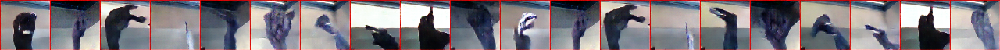

1 160.64332938194275


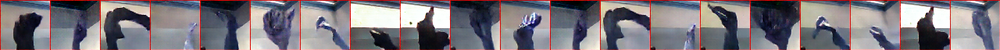

2 161.14541101455688


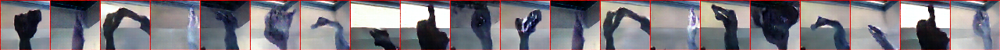

3 161.02036929130554


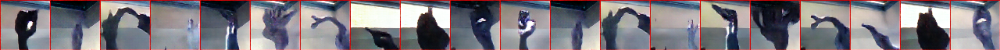

4 161.57816195487976


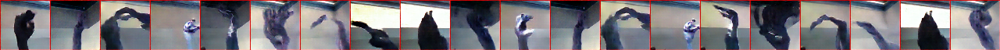

5 161.2420153617859


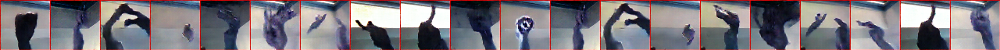

6 161.14488673210144


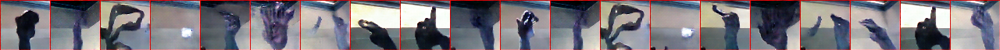

7 161.65062189102173


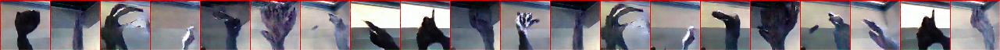

8 161.27620482444763


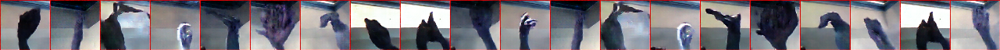

9 161.6619746685028


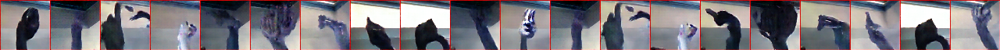

10 161.39228773117065


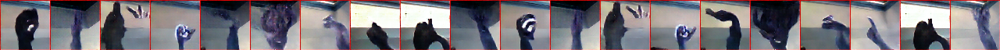

11 161.62118458747864


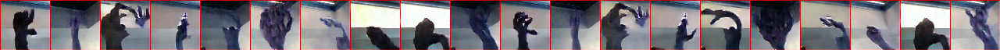

12 161.65162062644958


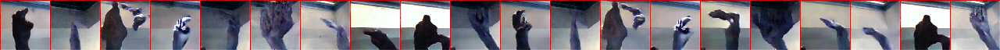

13 161.31565737724304


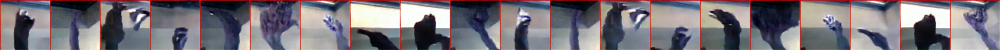

14 161.6093249320984


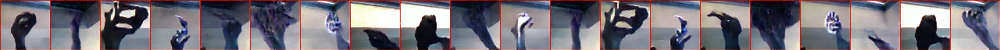

15 161.5136067867279


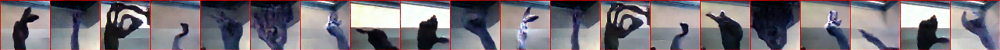

16 161.34789967536926


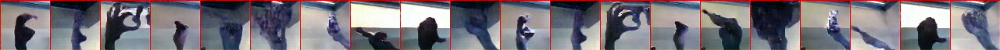

17 161.4594304561615


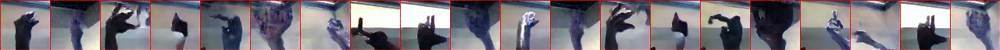

18 161.42356038093567


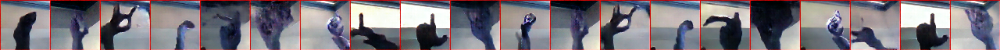

19 161.663170337677


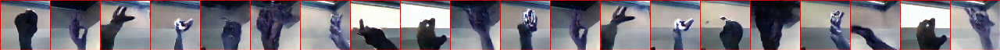

20 161.3592836856842


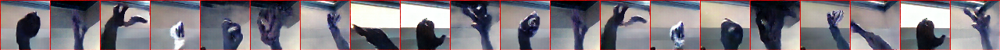

21 161.51947689056396


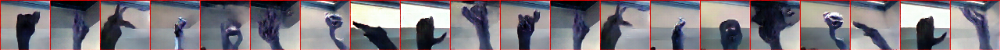

22 161.32332968711853


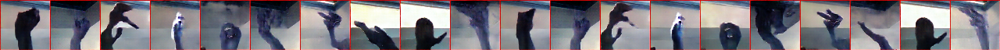

23 161.81051301956177


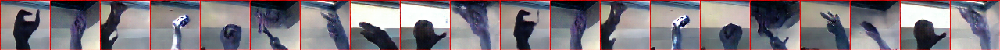

24 161.67457389831543


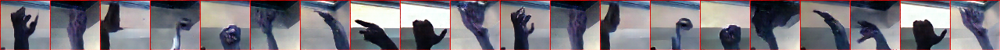

25 161.36893105506897


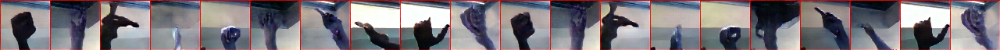

26 161.569561958313


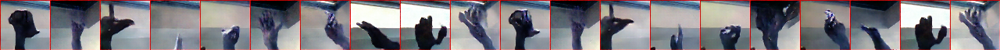

27 161.14644765853882


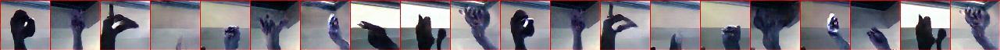

28 161.59174013137817


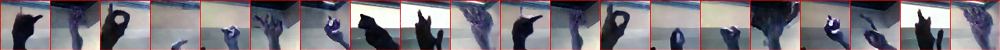

29 161.43793034553528


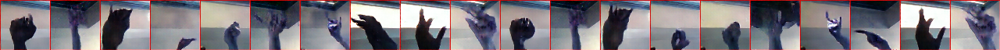

30 161.50512886047363


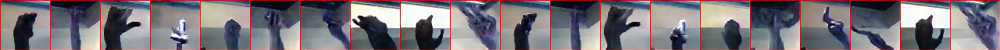

31 161.51558828353882


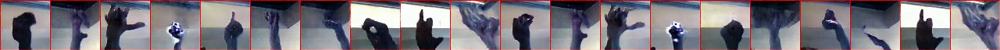

32 161.37079286575317


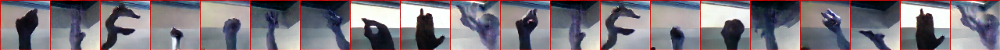

33 161.625746011734


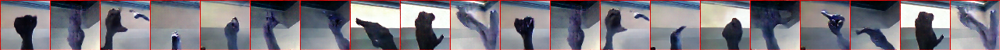

34 160.86398315429688


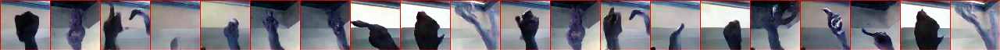

35 161.60143280029297


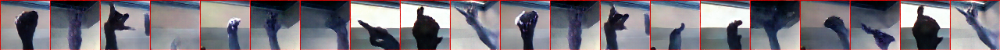

36 161.36069297790527


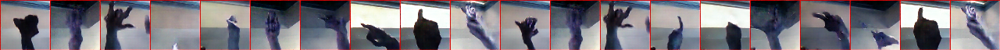

37 161.6097855567932


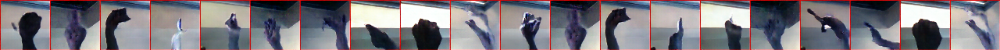

38 161.68113470077515


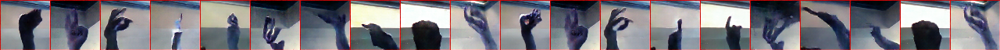

39 161.23727536201477


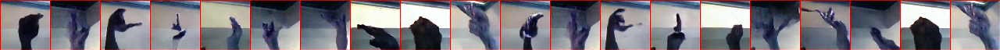

40 160.52808117866516


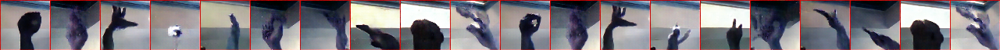

41 160.76101207733154


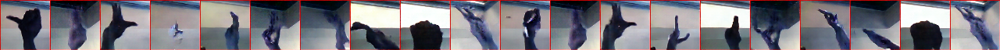

42 159.81285071372986


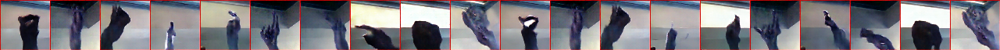

43 160.09530115127563


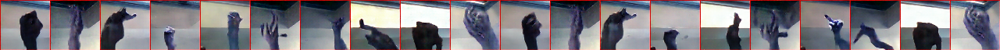

44 160.73405694961548


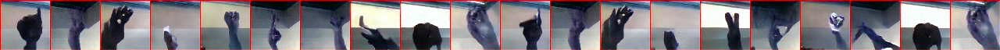

45 161.55012369155884


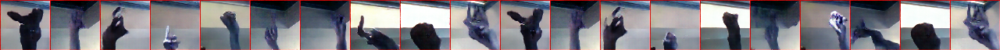

46 160.9492690563202


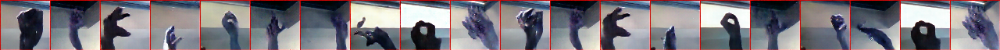

47 161.28500032424927


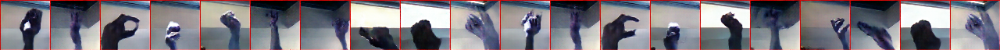

48 160.55656504631042


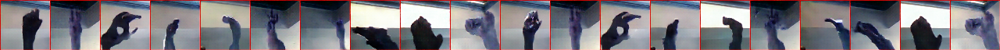

49 160.92315340042114


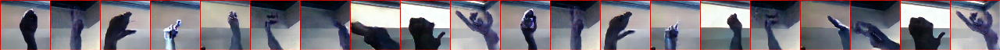

In [23]:
for epoch in range(50):
  start_time = time.time()
  for images, labels in train_dataset:
      #print(images.shape)
      #print(labels.shape)
      train_step(images, labels)
  fake = generator([random_vector_for_generation, condition_vector_generation], training=False)
  fake_concat = np.transpose(img_to_uint8(fake), [1,0,2,3]).reshape((64,-1,3))
  print(epoch, time.time()-start_time)
  display(PIL.Image.fromarray(fake_concat))
  
  